In [32]:
import sys
from os.path import join, exists, abspath
from os import getcwd
from glob import glob
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps, cm, colors
import scipy
from scipy.stats import ttest_1samp, pearsonr
import seaborn as sns

from tqdm import tqdm

In [2]:
import nibabel as nb
# import nitools as nt
from nilearn.plotting import plot_surf

In [3]:
# np.set_printoptions(linewidth=20)

In [4]:
def convert_pvalue_to_asterisks(pvalue):
    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return "ns"

---

In [5]:
dir_current = getcwd()

list_ = []
for ii, dname in enumerate(dir_current.split('\\')[:-3]):
    if ii==0:
        tmp = dname+'/'
    else:
        tmp = dname
    list_.append(tmp)
dir_git = join(*list_)
dir_git

'D:/mobaxterm\\sungbeenpark\\github'

In [6]:
dir_work = 'F:/SeqSpatialSupp_fMRI'
exists(dir_work)

True

In [7]:
path_module = abspath(join(dir_git,'nitools'))
if exists(path_module):
    print('added the path, %s'%path_module)
    if path_module not in sys.path:
        sys.path.append(path_module)

import nitools as nt

added the path, D:\mobaxterm\sungbeenpark\github\nitools


In [8]:
path_module = abspath(join(dir_git,'SUITPy'))
if exists(path_module):
    print('added the path, %s'%path_module)
    if path_module not in sys.path:
        sys.path.append(path_module)

import SUITPy as suit

added the path, D:\mobaxterm\sungbeenpark\github\SUITPy


In [9]:
path_module = abspath(join(dir_git))
if exists(path_module):
    print('added the path, %s'%path_module)
    if path_module not in sys.path:
        sys.path.append(path_module)

import surfAnalysisPy as surf

added the path, D:\mobaxterm\sungbeenpark\github


In [10]:
path_module = abspath(join(dir_git,'PcmPy'))
if exists(path_module):
    print('added the path, %s'%path_module)
    if path_module not in sys.path:
        sys.path.append(path_module)

import PcmPy as pcm

added the path, D:\mobaxterm\sungbeenpark\github\PcmPy


In [11]:
tmp = [1, 2, 3, 5, 6, 8, 9, 10, 11, 12, 13, 14]
list_nn = ['%02d'%i for i in tmp]
list_ss = ['S', 'R']
list_run = ['r%02d'%(i+1) for i in range(8)]

---

## ROI

In [12]:
dir_atlas = join(dir_git,'diedrichsenlab/atlas/fs_LR_32k')
underlay = join(dir_atlas,'fs_LR.32k.LR.sulc.dscalar.gii')
border = join(dir_git,'surfAnalysisPy/standard_mesh/fs_L/fs_LR.32k.L.border')

In [13]:
roi = nb.load(join(dir_atlas,'ROI.L.SSS.label.gii'))
list_roi = ['SMA', 'PMv', 'PMd', 'M1', 'S1', 'SPLa', 'SPLp', 'DSVC', 'MT+', 'VSVC', 'EAC']
data_roi = roi.darrays[0].data

# roi = nib.load(join(dir_atlas,'ROI.32k.L.label.gii'))
# list_roi = ['S1', 'M1', 'PMd', 'PMv', 'SMA', 'V1', 'SPLa', 'SPLp']
# data_roi = roi.darrays[0].data

print(np.unique(data_roi), data_roi.shape)

[ 0  1  2  3  4  5  6  7  8  9 10 11] (32492,)


column heads (1):
 ['col_1']


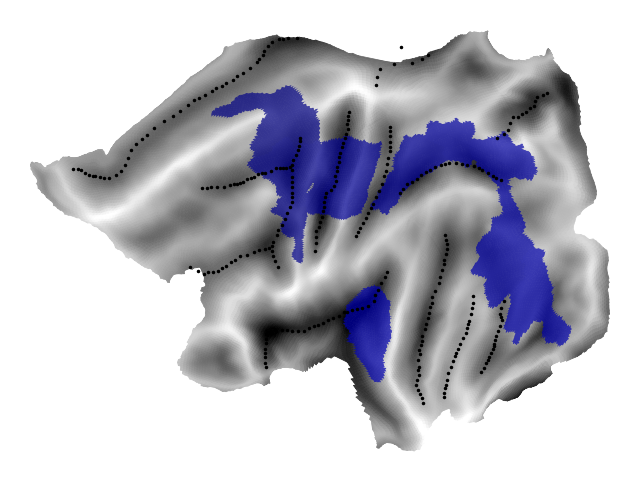

In [14]:
fig = plt.figure(figsize=(8,6))
ax = surf.plot.plotmap(
    data=data_roi*(data_roi!=0),
    surf='fs32k_L',
    underlay=underlay, alpha=0.7, cmap=cm.jet,
    borders=border, bordercolor='black', bordersize=3,
    overlay_type='func', label_names=list_roi, render='matplotlib'
)

cols = nt.get_gifti_column_names(roi)
print('column heads (%d):\n'%len(cols),cols)

---

## Load $\beta s$ of GLM3

In [15]:
dir_surf = join(dir_work,'surfaceWB/python')

In [16]:
glm = 3
stat = 'effect_size'
dir_data = join(dir_surf,'glm%1d'%glm)
exists(dir_data)

True

In [17]:
if glm == 2:
    list_contrast = [
        'Both_Rep_Letter', 'Both_Rep_Spatial', 'Cue_Rep_Letter', 'Cue_Rep_Spatial',
        'N_IN', 
        'N_Rep_Letter', 'N_Rep_Spatial', 'Seq_Rep_Letter', 'Seq_Rep_Spatial'
    ]
elif glm == 3:
    list_contrast = ['(%1d,%1d)'%(i//2,i%2) for i in range(8)]
print(list_contrast)

['(0,0)', '(0,1)', '(1,0)', '(1,1)', '(2,0)', '(2,1)', '(3,0)', '(3,1)']


### i) Individual data

In [19]:
subj = 'S01'
# batas = np.zeros((len(list_ss)*len(list_nn)),len(list_run),len(contrast),32492))
cond_vec = []
part_vec = []
betas = np.zeros((len(list_run)*len(list_contrast),32492))
for rr, run in enumerate(list_run):
    for cc, contrast in enumerate(list_contrast):
        idx = rr*len(list_contrast) + cc
        ## initialize the condition vector and the partition vector
        cond_vec.append(cc+1)
        part_vec.append(rr+1)
        fname = join(dir_data,'%s.%s.glm%1d.%s.%s.surf.pkl'%(subj,run,glm,contrast,stat))
        with open(fname, "rb") as file:  # "rb"는 읽기 모드와 바이너리 모드를 의미
            betas[idx,:] = pickle.load(file)
print(len(cond_vec), cond_vec)
print(len(part_vec), part_vec)

64 [1, 2, 3, 4, 5, 6, 7, 8, 1, 2, 3, 4, 5, 6, 7, 8, 1, 2, 3, 4, 5, 6, 7, 8, 1, 2, 3, 4, 5, 6, 7, 8, 1, 2, 3, 4, 5, 6, 7, 8, 1, 2, 3, 4, 5, 6, 7, 8, 1, 2, 3, 4, 5, 6, 7, 8, 1, 2, 3, 4, 5, 6, 7, 8]
64 [1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8]


### $Y_{residual}$

In [20]:
run = 'r01'
fname = join(dir_data,'%s.%s.glm%d.Y_res.surf.pkl'%(subj,run,glm))
with open(fname, "rb") as file:  # "rb"는 읽기 모드와 바이너리 모드를 의미
    y_res = pickle.load(file)
y_res.shape

(410, 32492)

### ii) Group data

In [21]:
Y = np.zeros((2*len(list_nn), len(cond_vec), 32492))
Y.shape

(24, 64, 32492)

In [23]:
for ii, ss in enumerate(list_ss):
    for jj, nn in enumerate(tqdm(list_nn)):
        subid = ii*len(list_nn)+jj
        subj = ss+nn
        for kk, (rr, cc) in enumerate(zip(part_vec, cond_vec)):
            contrast = list_contrast[cc-1]
            fname = join(dir_data,'%s.r%02d.glm%1d.%s.%s.surf.pkl'%(subj,rr,glm,contrast,stat))
            with open(fname, "rb") as file:  # "rb"는 읽기 모드와 바이너리 모드를 의미
                beta = pickle.load(file)
            Y[subid, kk, :] = beta

100%|██████████| 12/12 [00:06<00:00,  2.00it/s]


### Organizing data by ROI

In [24]:
dict_Y = {}
for ii, roi in enumerate(list_roi):
    val = ii+1
    print(roi)
    tmp = Y[:,:,data_roi==val]
    print(tmp.shape)
    dict_Y[roi] = tmp
del Y

SMA
(24, 64, 683)
PMv
(24, 64, 302)
PMd
(24, 64, 633)
M1
(24, 64, 305)
S1
(24, 64, 773)
SPLa
(24, 64, 711)
SPLp
(24, 64, 375)
DSVC
(24, 64, 462)
MT+
(24, 64, 743)
VSVC
(24, 64, 596)
EAC
(24, 64, 615)


In [25]:
obs_des = {
    'cond_vec': cond_vec,
    'part_vec': part_vec
}
dataset_Y = {}
for roi in list_roi:
    Y = dict_Y[roi]
    tmp = []
    for subid in range(len(Y)):
        tmp.append(pcm.dataset.Dataset(Y[subid], obs_descriptors = obs_des))
    dataset_Y[roi] = tmp

### - Second moment matrix $G$:
$$
G = \text{var}(U) = \frac{UU^{T}}{P}
$$

cf)
$$
Y = ZU + XB + \epsilon
$$
where $Y$ is activity data $(N \times P)$, $Z$ is a condition matrix $(N \times K)$, and $X$ is a fixed effect matrix to be removed. Additionally, $N$ represents the number of samples, $P$ stands for the number of voxels or channels, and $K$ denotes the number of conditions.

### - Remove fixed effects $X$ from $Y$
$$
Y' = Y - XB = Y - X\big(X^{+}Y\big)
$$
Now, the matrix $Y'$ can be organized as follows.
$$
Y' = ZU + \epsilon
$$
Here, if $Z$ represents an indicator for the condition, then $Y' = U$:
$$
Y'_{ij} = Z_{ik}U_{kj}, \text{ where } Z_{ik} = \delta_{ik}
$$

### - Cross-validation
Let $Z_{i}$ be the $Z$ matrix of the $i$-th block and $Y'_{i}$ be the $Y'$ matrix of the $i$-th block. If we denote all blocks except for the $i$-th block as $\neg i$, the matrix $U$ can be determined as follows.
$$U_{i}=Z_{i}^{+}Y'_{i} + \epsilon_{i}$$
$$U_{\neg i}=Z_{\neg i}^{+}Y'_{\neg i} + \epsilon_{\neg i}$$
Note that both $U_{i}$ and $U_{\neg i}$ are $(K \times P)$ matrices. The second moment matrix $\hat{G}$ can then be computed as follows:
$$
\hat{G} = \frac{1}{B}\sum_{i}^{B}\frac{U_{i}U_{\neg i}}{P}
$$
where $B$ denotes the number of blocks.

SMA
(24, 8, 8)
[ 4.47233396e-19 -1.92445886e-18 -4.36391374e-18  1.23327997e-18
  4.06575815e-19 -1.73472348e-18  1.33831206e-19  3.18484388e-18
  1.19262239e-17 -2.60208521e-18 -5.69206141e-19  2.98155597e-18
 -2.20228566e-18  3.25260652e-19 -7.45388994e-19  2.49027686e-19
 -2.08708918e-18  4.28259858e-18  1.74827600e-18  2.87313576e-18
  3.16587034e-17  2.71050543e-19  3.90312782e-18  2.68340038e-18]
PMv
(24, 8, 8)
[ 2.24971951e-18 -3.25260652e-18 -2.35813973e-18  2.16840434e-19
 -2.98155597e-19  4.77048956e-18 -2.13113490e-18  3.49655201e-18
 -1.95156391e-18 -2.65629532e-18 -1.02999206e-18  1.34712120e-17
 -1.08420217e-19 -3.95733793e-18  7.58941521e-19 -9.48676901e-19
  2.71050543e-20  1.24683250e-18  1.62630326e-18 -2.16840434e-19
  6.53231809e-18 -3.11708125e-19 -1.62630326e-18 -7.42678488e-18]
PMd
(24, 8, 8)
[-2.37169225e-20 -3.95733793e-18  1.82281490e-18  8.13151629e-19
  2.33103467e-18  3.44234190e-18 -5.75982404e-20  1.19262239e-18
  1.30104261e-18 -4.33680869e-19 -1.8838012

C:\Users\psb62\anaconda3\envs\SSS\lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\psb62\anaconda3\envs\SSS\lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
C:\Users\psb62\anaconda3\envs\SSS\lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\psb62\anaconda3\envs\SSS\lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)
C:\Users\psb62\anaconda3\envs\SSS\lib\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\psb62\anaconda3\envs\SSS\lib\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


[ 4.25549353e-18             nan  5.20417043e-18 -8.67361738e-19
  5.42101086e-18             nan  3.93023288e-19  2.71050543e-19
 -1.12757026e-17 -4.33680869e-19  7.04731412e-19  1.14925430e-17
  1.20617492e-18 -1.40946282e-18 -6.07153217e-18  7.86046575e-19
 -3.27971157e-18             nan  6.50521303e-19 -1.12757026e-17
 -1.78893358e-18  9.75781955e-19  6.50521303e-19 -1.68051337e-17]
EAC
(24, 8, 8)
[-4.47233396e-19  2.60208521e-18  1.20617492e-18  1.46367293e-18
 -3.90312782e-18  9.48676901e-19 -5.21772296e-19  4.44522891e-18
 -5.20417043e-18 -6.23416249e-19 -1.32137140e-18  5.20417043e-18
 -2.81214938e-19 -5.82758668e-19 -8.80914265e-20  8.87690529e-19
 -1.26377316e-18  8.13151629e-19 -4.87890978e-19  1.08420217e-18
  9.92044988e-18  2.16840434e-19  3.84891771e-18  2.22261445e-18]


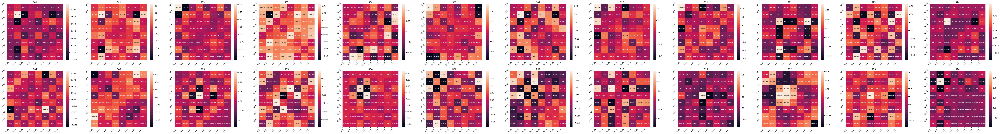

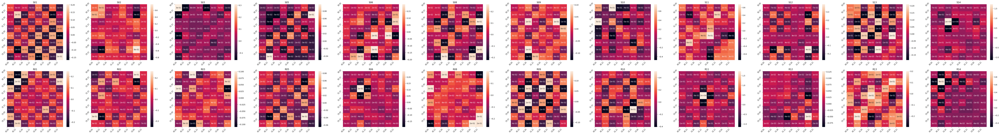

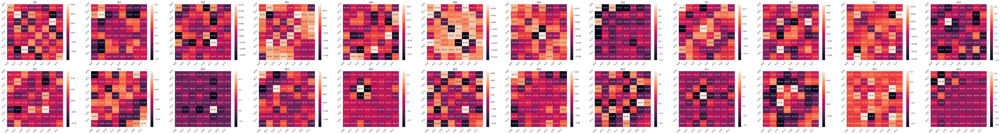

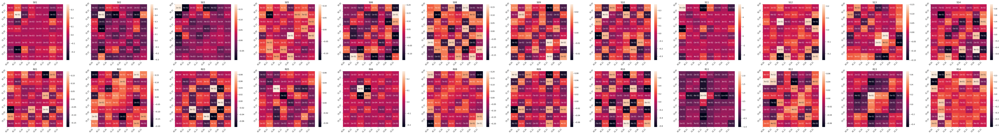

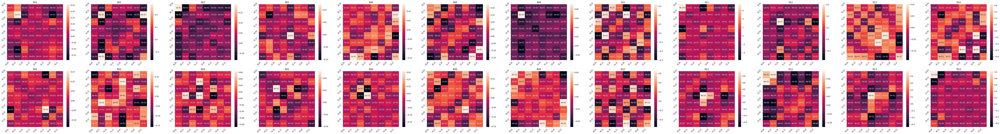

...

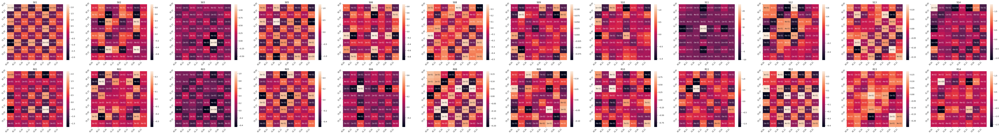

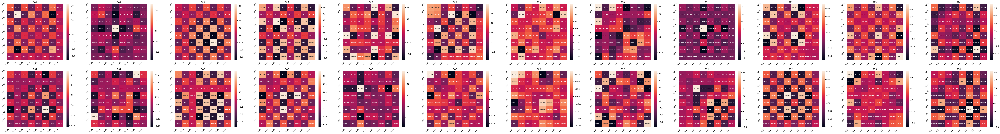

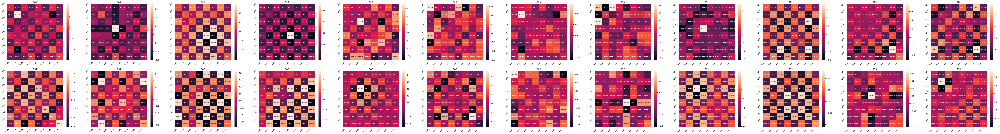

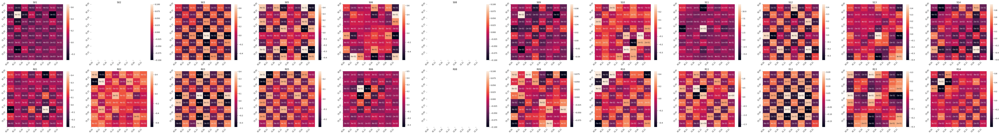

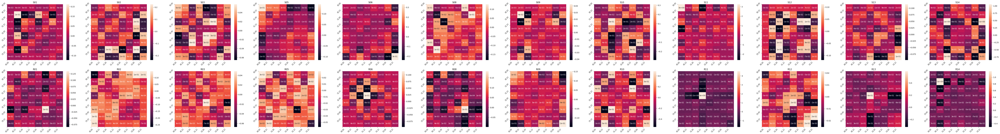

In [30]:
nrows, ncols = len(list_ss), len(list_nn)
# Estimate and plot the second moment matrices G across all data sets
dict_G_hat = {}
for roi in list_roi:
    print(roi)
    Y = dataset_Y[roi]
    N = len(Y)
    C = len(np.unique(cond_vec))
    G_hat = np.zeros((N,C,C))
    for subid in range(N):
        G_hat[subid,:,:],_ = pcm.est_G_crossval(
            Y=Y[subid].measurements,
            Z=Y[subid].obs_descriptors['cond_vec'],
            part_vec=Y[subid].obs_descriptors['part_vec'],
            X=pcm.matrix.indicator(Y[subid].obs_descriptors['part_vec'])
        )
    print(G_hat.shape)
    
    fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(8*ncols, 6*nrows))
    axs = np.concatenate(axs)
    # show all second moment matrices G
    ## G.shape = (n_subject, 5, 5)
    vmin = G_hat.min()
    vmax = G_hat.max()
    for subid in range(N):
        ax = axs[subid]
        # ax.imshow(G_hat[subid,:,:],vmin=vmin,vmax=vmax)
        sns.heatmap(G_hat[subid,:,:], annot=True, fmt='.0e', ax=ax)
        ss = 'S' if subid//12==0 else 'R'
        nn = list_nn[subid%12]
        subj = ss+nn
        ax.set_title(subj)
        ax.set_xticks(np.arange(len(list_contrast)), list_contrast, rotation=45)
        ax.set_yticks(np.arange(len(list_contrast)), list_contrast, rotation=45)

    dict_G_hat[roi] = G_hat
    ## mean of each G_hat is 0
    print(np.mean(G_hat, axis=(1,2)))

    # fig.savefig(
    #     join(dir_result,'fig.%s.G_hat.%s.png'%(dname,roi)),
    #     dpi=300, facecolor=[1,1,1,1],
    #     bbox_inches='tight'
    # )

### Check the validation of $\hat{G}$

- correlation($\hat{G}_{i}, \hat{G}_{\neg i}$)

In [34]:
list_df = []

for roi in tqdm(list_roi):
    Y = dataset_Y[roi]
    N = len(Y)
    C = len(np.unique(cond_vec))
    ## obtain the second moment matrix G
    G_hat = np.zeros((N,C,C))
    for subid in range(N):
        G_hat[subid,:,:],_ = pcm.est_G_crossval(
            Y=Y[subid].measurements,
            Z=Y[subid].obs_descriptors['cond_vec'],
            part_vec=Y[subid].obs_descriptors['part_vec'],
            X=pcm.matrix.indicator(Y[subid].obs_descriptors['part_vec'])
        )
    ## calculate correlation
    for gg, group in enumerate(['S','R']):
        idx_g = [i+gg*12 for i in range(12)]
        G_tmp = G_hat[idx_g]
        for ii, nn in enumerate(list_nn):
            idx_a = [True if i==ii else False for i in range(12)]
            idx_b = [True if i!=ii else False for i in range(12)]
            a = G_tmp[idx_a][0]
            b = G_tmp[idx_b].mean(axis=0)
            
            idx_triu = np.triu_indices(a.shape[0])
            coef, pval = pearsonr(
                a[idx_triu], b[idx_triu]
            )
            list_df.append(
                {'roi':roi, 'sess':group, 'subj':nn, 'corr':coef, 'pval':pval}
            )

df = pd.DataFrame(list_df)
df

 82%|████████▏ | 9/11 [00:01<00:00,  5.12it/s]


ValueError: array must not contain infs or NaNs

### - Crossnobis distance
$$ diag(CGC^{T}) \rightarrow D^{2} $$

In [ ]:
for ii, (roi, G_hat) in enumerate(tqdm(dict_G_hat.items())):
    for subid in range(N):
        D_eucl = pcm.G_to_dist(G_hat[subid])
        sns.heatmap(D_eucl, annot=True, fmt='.0e', ax=ax)
        ss = 'S' if subid//12==0 else 'R'
        nn = list_nn[subid%12]
        subj = ss+nn
        ax.set_title(subj)
        ax.set_xticks(np.arange(len(list_label)), list_label, rotation=45)
        ax.set_yticks(np.arange(len(list_label)), list_label, rotation=45)

    fig.savefig(
        join(dir_result,'fig.%s.D_eucl.%s.png'%(dname,roi)),
        dpi=300, facecolor=[1,1,1,1],
        bbox_inches='tight'
    )

---

## Pattern

In [11]:
dir_pattern = join('D:/milli/diedrichsenlab/SeqSpatialSupp_fMRI/patterns')
exists(dir_pattern)
# print(glob(join(dir_pattern, '*_fRDM.glm3.mat')))

False

- ROIs:
    1. SMA
    2. PMv
    3. PMd
    4. M1
    5. S1
    6. SPLa
    7. SPLd
    8. DSVC
    9. MT+
    10. VSVC
    11. EAC
- State: $(s,c)$, where $s$ is Sequence, $c$ is Cue.
    1. $s$
        - 0: 32451
        - 1: 35124
        - 2: 13254
        - 3: 14523
    2. $c$ :
        - 0: letter
        - 1: spatial
- Transition: $(s_i, c_i) \rightarrow (s_f, c_f)$
    - 0: (0,0) -> (0,0)
    - 1: (0,0) -> (0,1)
    - $\vdots$
    - 63: (3,1) -> (3,1)

|     |(0,0)|(0,1)|(1,0)|(1,1)|(2,0)|(2,1)|(3,0)|(3,1)| 
|-----|-----|-----|-----|-----|-----|-----|-----|-----|
|(0,0)|  B  | S00 | C01 | N02 | C03 | N04 | C05 | N06 |
|(0,1)|     |  B  | N07 | C08 | N09 | C10 | N11 | C12 |
|(1,0)|     |     |  B  | S13 | C14 | N15 | C16 | N17 |
|(1,1)|     |     |     |  B  | N18 | C19 | N20 | C21 |
|(2,0)|     |     |     |     |  B  | S22 | C23 | N24 |
|(2,1)|     |     |     |     |     |  B  | N25 | C26 |
|(3,0)|     |     |     |     |     |     |  B  | S27 |
|(3,1)|     |     |     |     |     |     |     |  B  |

$$\downarrow$$

|     |(0,0)|(1,0)|(2,0)|(3,0)|(0,1)|(1,1)|(2,1)|(3,1)| 
|-----|-----|-----|-----|-----|-----|-----|-----|-----|
|(0,0)|  B  | C01 | C03 | C05 | S00 | N02 | N04 | N06 |
|(1,0)|     |  B  | C14 | C16 | N07 | S13 | N15 | N17 |
|(2,0)|     |     |  B  | C23 | N09 | N18 | S22 | N24 |
|(3,0)|     |     |     |  B  | N11 | N20 | N25 | S27 |
|(0,1)|     |     |     |     |  B  | C08 | C10 | C12 |
|(1,1)|     |     |     |     |     |  B  | C19 | C21 |
|(2,1)|     |     |     |     |     |     |  B  | C26 |
|(3,1)|     |     |     |     |     |     |     |  B  |

In [12]:
idx_RDM = np.array([
    1, 3, 5, 0, 2, 4, 6,
    14, 16, 7, 13, 15, 17,
    23, 9, 18, 22, 24,
    11, 20, 25, 27,
    8, 10, 12,
    19, 21,
    26
])

$$RDM = \begin{bmatrix}
\textcolor{gray}{B} & C & C & C & S & N & N & N \\
\cdot & \textcolor{gray}{B} & C & C & N & S & N & N \\
\cdot & \cdot & \textcolor{gray}{B} & C & N & N & S & N \\
\cdot & \cdot & \cdot & \textcolor{gray}{B} & N & N & N & S \\
\cdot & \cdot & \cdot & \cdot & \textcolor{gray}{B} & C & C & C \\
\cdot & \cdot & \cdot & \cdot & \cdot & \textcolor{gray}{B} & C & C \\
\cdot & \cdot & \cdot & \cdot & \cdot & \cdot & \textcolor{gray}{B} & C \\
\cdot & \cdot & \cdot & \cdot & \cdot & \cdot & \cdot & \textcolor{gray}{B}
\end{bmatrix}$$
The number of elements on the upper triangle $= \frac{8\cdot 7}{2} = 28$
- B: both of cue and sequence repetition (8 trials)
- S: only sequence repetition (8 trials)
- C: only cue repetition (24 trials)
- N: no repetition (24 trials)

In [13]:
RDM = np.array([
    'C', 'C', 'C', 'S', 'N', 'N', 'N',
         'C', 'C', 'N', 'S', 'N', 'N',
              'C', 'N', 'N', 'S', 'N',
                   'N', 'N', 'N', 'S',
                        'C', 'C', 'C',
                             'C', 'C',
                                  'C'
])

In [14]:
list_var = ['beta', 'glm', 'subj', 'nvoxels', 'ROI', 'normmode', 'RDM',]

subj = 'S01' ## -> ss
data = scipy.io.loadmat(join(dir_pattern,'%s_fRDM.glm3.mat'%subj))['Data']
for i, dd in enumerate(data[0,0]):
    print('i=%d: %s - %s'%(i,dd.shape,list_var[i]))
betas = data[0,0][0][:,0]
nvoxels = data[0,0][3][:,0]
rois = data[0,0][4][:,0]
rdms = data[0,0][6][:,0]

i=0: (11, 1) - beta
i=1: (22, 1) - glm
i=2: (22, 1) - subj
i=3: (22, 1) - nvoxels
i=4: (22, 1) - ROI
i=5: (11,) - normmode
i=6: (11, 1) - RDM


In [15]:
list_diss = []

for ss, subj in enumerate(list_subj):
    group = subj[0]
    fname = join(dir_pattern,'%s_fRDM.glm3.mat'%subj)
    if not exists(fname):
        continue
    data = scipy.io.loadmat(fname)['Data'][0,0]
    betas = data[0][:,0]
    nvoxels = data[3][:,0]
    rois = data[4][:,0]
    rdms = data[6][:,0]
    for rr, roi_ in enumerate(rois[:11]):
        roi = str(roi_[0])[4:-2]
        # print(roi)
        
        rdm = rdms[rr][0]
        rdm_ordered = rdm[idx_RDM].copy()

        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'sameSeq_across', 'mean':rdm_ordered[np.where(RDM=='S')[0]].mean()})
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffSeq_across', 'mean':rdm_ordered[np.where(RDM=='N')[0]].mean()})
        
        tmp = np.where(RDM=='C')[0];
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffSeq_within_L', 'mean':rdm_ordered[tmp[tmp<14]].mean()})
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffSeq_within_S', 'mean':rdm_ordered[tmp[tmp>=14]].mean()})
        
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffSeq_sameFing_within_L', 'mean':rdm_ordered[[0,13]].mean()})
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffSeq_sameFing_within_S', 'mean':rdm_ordered[[22,27]].mean()})
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffSeq_sameFing_across', 'mean':rdm_ordered[[4,9,17,20]].mean()})
        
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffFing_within_L', 'mean':rdm_ordered[[1,2,7,8]].mean()})
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffFing_within_S', 'mean':rdm_ordered[[23,24,25,26]].mean()})
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'diffFing_across', 'mean':rdm_ordered[[5,6,11,12,14,15,18,19]].mean()})
        
        list_diss.append({'group':group, 'subj':subj, 'roi':roi, 'diss':'sameFing_across', 'mean':rdm_ordered[[3,4,9,10,16,17,20,21]].mean()})

In [16]:
df = pd.DataFrame(list_diss)
print(df.subj.unique())
df

['S01' 'S02' 'S03' 'S05' 'S06' 'S08' 'S09' 'S10' 'S11' 'S12' 'S13' 'S14'
 'R01' 'R02' 'R03' 'R05' 'R06' 'R08' 'R09' 'R10' 'R12' 'R14']


,group,subj,roi,diss,mean
0,S,S01,SMA,sameSeq_across,67.842349
1,S,S01,SMA,diffSeq_across,76.650954
2,S,S01,SMA,diffSeq_within_L,7.196836
3,S,S01,SMA,diffSeq_within_S,10.205476
4,S,S01,SMA,diffSeq_sameFing_within_L,-0.563379
...,...,...,...,...,...
2657,R,R14,EAC,diffSeq_sameFing_across,-2.441749
2658,R,R14,EAC,diffFing_within_L,-0.040054
2659,R,R14,EAC,diffFing_within_S,1.696998
2660,R,R14,EAC,diffFing_across,-0.268984


In [17]:
# list_diss = df.diss.unique()
list_diss = [
    'diffFing_within_L', 'diffFing_within_S', 'diffFing_across',
    'diffSeq_sameFing_within_L', 'diffSeq_sameFing_within_S', 'diffSeq_sameFing_across',
    'sameSeq_across'
]
list_diss

['diffFing_within_L',
 'diffFing_within_S',
 'diffFing_across',
 'diffSeq_sameFing_within_L',
 'diffSeq_sameFing_within_S',
 'diffSeq_sameFing_across',
 'sameSeq_across']

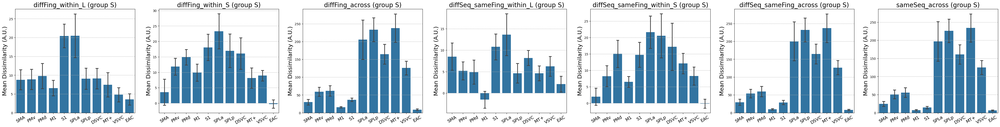

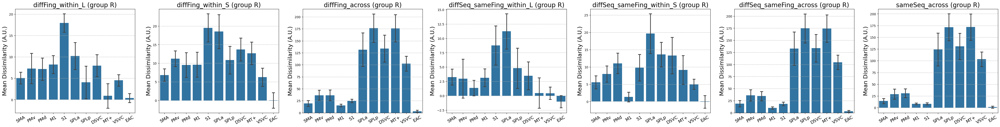

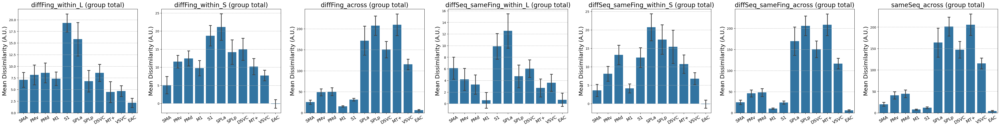

In [18]:
ncols = len(list_diss)
nrows = 1
# fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8*ncols,6*nrows))
for gg, group in enumerate(['S','R','total']):
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8*ncols,6*nrows))
    for ii, diss in enumerate(list_diss):
        # ax = axs[gg,ii]
        ax = axs[ii]
        plt.sca(ax)

        if not group == 'total':
            df_tmp = df[(df.group==group)&(df.diss==diss)]
        else:
            df_tmp = df[df.diss==diss]
            
        sns.barplot(
            data=df_tmp,
            x='roi', y='mean',
            capsize=0.2, errorbar='se'
        )
        plt.xticks(rotation=30, fontsize=14)
        plt.ylabel('Mean Dissimilarity (A.U.)', fontsize=18)
        plt.xlabel('')
        plt.title('%s (group %s)'%(diss,group), fontsize=20)
        plt.grid(axis='y', linestyle='--')
    fig.savefig(
        join(dir_work,'results/fig.barplot.glm3.rdm.%s.png'%group),
        dpi=300, facecolor=[1,1,1,1],
        bbox_inches = "tight"
    )

In [19]:
# fig.savefig(
#     join(dir_work,'results/fig.barplot.glm3.rdm.png'),
#     dpi=300, facecolor=[1,1,1,1],
#     bbox_inches = "tight"
# )

In [20]:
df_tmp.diss.unique()

array(['sameSeq_across'], dtype=object)

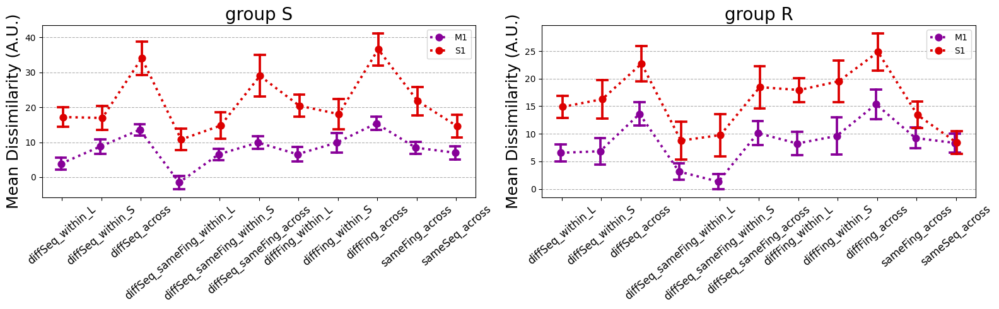

In [21]:
ncols = 2
fig, axs = plt.subplots(ncols=ncols, figsize=(8*ncols,5))

list_roi = ['M1', 'S1']
# list_roi = ['PMv', 'PMd', 'SPLa', 'SPLp']
# list_roi = ['M1', 'S1', 'PMv', 'PMd', 'SPLa', 'SPLp']
palette = [colors.to_hex(rgba) for rgba in cm.nipy_spectral(np.linspace(0.1,0.9,len(list_roi)))]

# order = df_tmp.diss.unique()
order = [
    'diffSeq_within_L','diffSeq_within_S','diffSeq_across',
    'diffSeq_sameFing_within_L', 'diffSeq_sameFing_within_S', 'diffSeq_sameFing_across',
    'diffFing_within_L', 'diffFing_within_S', 'diffFing_across',
    'sameFing_across', 'sameSeq_across'
]
for gg, group in enumerate(['S', 'R']):
    ax = axs[gg]
    plt.sca(ax)
    df_tmp = df[df.group==group]
    # df_tmp = df_tmp[(df_tmp.roi=='M1')|(df_tmp.roi=='S1')|(df_tmp.roi=='PMv')|(df_tmp.roi=='PMd')|(df_tmp.roi=='SPLa')|(df_tmp.roi=='SPLp')]
    df_tmp = df_tmp.loc[np.unique([df_tmp[df_tmp.roi==roi].index for roi in list_roi])]
    sns.pointplot(
        data=df_tmp,
        x='diss', y='mean', order=order,
        hue='roi', linestyles=':',
        capsize=0.25, errorbar='se', dodge=True,
        palette=palette,
    )
    plt.title('group %s'%group, fontsize=20)
    plt.xlabel('')
    plt.xticks(rotation=40, fontsize=12)
    plt.ylabel('Mean Dissimilarity (A.U.)', fontsize=18)
    plt.grid(axis='y', linestyle='--')
    plt.legend()

    ## t-test
    # dy = np.diff(ax.get_ylim())[0] * 0.05
    # cnt = np.zeros(len(order), dtype=int)
    # for rr, roi in enumerate(list_roi):
    #     print('%s: %s'%(group,roi))
    #     for xx, diss in enumerate(order):
    #         tmp = df_tmp[(df_tmp.roi==roi)&(df_tmp.diss==diss)]['mean']
    #         res = scipy.stats.ttest_1samp(tmp, popmean=0)
    #         print('%s: t(%d)=%.5f (%sp=%.5f)'%(diss, res.df, res.statistic, convert_pvalue_to_asterisks(res.pvalue), res.pvalue))
    #         x = xx
    #         y = tmp.mean() + tmp.sem() + dy*(cnt[xx]+1)
    #         if res.pvalue > 0.05:
    #             plt.text(
    #                 x=x, y=y,
    #                 s=convert_pvalue_to_asterisks(res.pvalue),
    #                 color=palette[rr], fontweight='bold',
    #                 ha='center', va='center',
    #             )
    #             cnt[xx] += 1
    #     print('')
        

fig.tight_layout()

In [22]:
fig.savefig(
    join(dir_work,'results/fig.pointplot.glm3.rdm.m1s1.png'),
    dpi=300, facecolor=[1,1,1,1],
    bbox_inches = "tight"
)

---